# Importing Required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Loading The Dataset

In [2]:
dataset = pd.read_csv('SolarPrediction.csv')
dataset = dataset.sort_values(['UNIXTime'], ascending = [True])
dataset1 = dataset.sort_values(['UNIXTime'], ascending = [True])
dataset.head()

,UNIXTime,Data,Time,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,TimeSunRise,TimeSunSet
7416,1472724008,9/1/2016 12:00:00 AM,00:00:08,2.58,51,30.43,103,77.27,11.25,06:07:00,18:38:00
7415,1472724310,9/1/2016 12:00:00 AM,00:05:10,2.83,51,30.43,103,153.44,9.00,06:07:00,18:38:00
7414,1472725206,9/1/2016 12:00:00 AM,00:20:06,2.16,51,30.43,103,142.04,7.87,06:07:00,18:38:00
7413,1472725505,9/1/2016 12:00:00 AM,00:25:05,2.21,51,30.43,103,144.12,18.00,06:07:00,18:38:00
7412,1472725809,9/1/2016 12:00:00 AM,00:30:09,2.25,51,30.43,103,67.42,11.25,06:07:00,18:38:00


# Feature Engineering
First step upon importing the dataset was to convert time and date parameters into a more useful format and add some coloumns that may be useful for visualisation, modelling and analysis.

In [3]:
from datetime import datetime
from pytz import timezone
import pytz
hawaii= timezone('Pacific/Honolulu')
dataset.index =  pd.to_datetime(dataset['UNIXTime'], unit='s')
dataset.index = dataset.index.tz_localize(pytz.utc).tz_convert(hawaii)
dataset['MonthOfYear'] = dataset.index.strftime('%m').astype(int)
dataset['DayOfYear'] = dataset.index.strftime('%j').astype(int)
dataset1['DayOfYear'] = dataset.index.strftime('%j').astype(int)
dataset['WeekOfYear'] = dataset.index.strftime('%U').astype(int)
dataset['TimeOfDay(h)'] = dataset.index.hour
dataset['TimeOfDay(m)'] = dataset.index.hour*60 + dataset.index.minute
dataset['TimeOfDay(s)'] = dataset.index.hour*60*60 + dataset.index.minute*60 + dataset.index.second
dataset1['TimeOfDay(s)'] = dataset.index.hour*60*60 + dataset.index.minute*60 + dataset.index.second
dataset['TimeSunRise'] = pd.to_datetime(dataset['TimeSunRise'], format='%H:%M:%S')
dataset['TimeSunSet'] = pd.to_datetime(dataset['TimeSunSet'], format='%H:%M:%S')
dataset['DayLength(s)'] = dataset['TimeSunSet'].dt.hour*60*60 \
                           + dataset['TimeSunSet'].dt.minute*60 \
                           + dataset['TimeSunSet'].dt.second \
                           - dataset['TimeSunRise'].dt.hour*60*60 \
                           - dataset['TimeSunRise'].dt.minute*60 \
                           - dataset['TimeSunRise'].dt.second
dataset.drop(['Data','Time','TimeSunRise','TimeSunSet'], inplace=True, axis=1)

dataset.head()

,UNIXTime,Radiation,Temperature,Pressure,Humidity,WindDirection(Degrees),Speed,MonthOfYear,DayOfYear,WeekOfYear,TimeOfDay(h),TimeOfDay(m),TimeOfDay(s),DayLength(s)
UNIXTime,,,,,,,,,,,,,,
2016-09-01 00:00:08-10:00,1472724008,2.58,51,30.43,103,77.27,11.25,9,245,35,0,0,8,45060
2016-09-01 00:05:10-10:00,1472724310,2.83,51,30.43,103,153.44,9.00,9,245,35,0,5,310,45060
2016-09-01 00:20:06-10:00,1472725206,2.16,51,30.43,103,142.04,7.87,9,245,35,0,20,1206,45060
2016-09-01 00:25:05-10:00,1472725505,2.21,51,30.43,103,144.12,18.00,9,245,35,0,25,1505,45060
2016-09-01 00:30:09-10:00,1472725809,2.25,51,30.43,103,67.42,11.25,9,245,35,0,30,1809,45060


# Feature Visualisation
Next, in order to get a better understanding of the data, hourly and monthly means of several variables were visualised using bar plots.

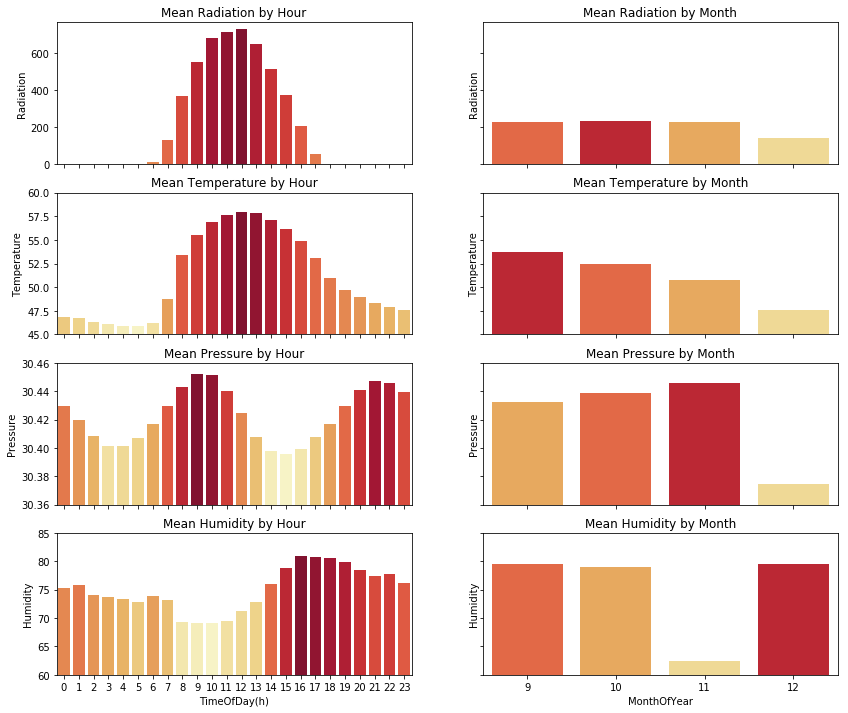

In [4]:
grouped_m=dataset.groupby('MonthOfYear').mean().reset_index()
grouped_w=dataset.groupby('WeekOfYear').mean().reset_index()
grouped_d=dataset.groupby('DayOfYear').mean().reset_index()
grouped_h=dataset.groupby('TimeOfDay(h)').mean().reset_index()

f, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, sharex='col', sharey='row', figsize=(14,12))
ax3.set_ylim(45,60)
ax5.set_ylim(30.36,30.46)
ax7.set_ylim(60,85)

ax1.set_title('Mean Radiation by Hour')
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Radiation'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Radiation', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax1)
ax1.set_xlabel('')

ax2.set_title('Mean Radiation by Month')
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Radiation'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Radiation', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax2)
ax2.set_xlabel('')

ax3.set_title('Mean Temperature by Hour')
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Temperature'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Temperature', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax3)
ax3.set_xlabel('')

ax4.set_title('Mean Temperature by Month')
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Temperature'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Temperature', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax4)
ax4.set_xlabel('')

ax5.set_title('Mean Pressure by Hour')
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Pressure'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Pressure', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax5)
ax5.set_xlabel('')

ax6.set_title('Mean Pressure by Month')
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Pressure'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Pressure', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax6)
ax6.set_xlabel('')

ax7.set_title('Mean Humidity by Hour')
pal = sns.color_palette("YlOrRd_r", len(grouped_h))
rank = grouped_h['Humidity'].argsort().argsort() 
g = sns.barplot(x="TimeOfDay(h)", y='Humidity', data=grouped_h, palette=np.array(pal[::-1])[rank], ax=ax7)

ax8.set_title('Mean Humidity by Month')
pal = sns.color_palette("YlOrRd_r", len(grouped_m))
rank = grouped_m['Humidity'].argsort().argsort() 
g = sns.barplot(x="MonthOfYear", y='Humidity', data=grouped_m, palette=np.array(pal[::-1])[rank], ax=ax8)

plt.show()

# Pearson Correlation
To further help visualise any realtionships between the variables, a pearson correlation heatmap was plotted.

From the plots in the previous section it is clear that solar irradiance does not have a linear correlation with time of day. Therefore, despite the strong realtionship between the two, 'TimeOfDay' columns were excluded from the heatmap. 'UNIXTime', 'MonthOfYear' and 'WeekOfYear' were also excluded because it is likely to more useful to use a combination of 'TimeOfDay' and 'DayOfYear' in training and prediction.

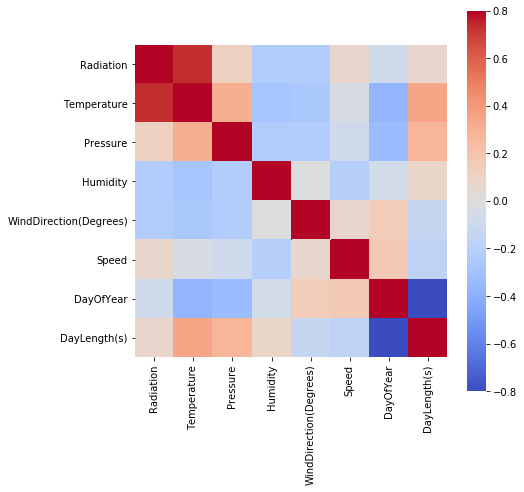

In [5]:
corrmat = dataset.drop(['TimeOfDay(h)', 'TimeOfDay(m)', 'TimeOfDay(s)', 'UNIXTime', 'MonthOfYear', 'WeekOfYear'], inplace=False, axis=1)
corrmat = corrmat.corr()
f, ax = plt.subplots(figsize=(7,7))
sns.heatmap(corrmat, vmin=-.8, vmax=.8, square=True, cmap = 'coolwarm')
plt.show()

In [6]:
X = dataset[['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed', 'DayOfYear', 'TimeOfDay(s)']]
y = dataset['Radiation']

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Feature Selection


In [8]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train, y_train)
feature_importances = regressor.feature_importances_

X_train_opt = X_train.copy()
removed_columns = pd.DataFrame()
models = []
r2s_opt = []

for i in range(0,5):
    least_important = np.argmin(feature_importances)
    #print(least_important)
    removed_columns = removed_columns.append(X_train_opt.pop(X_train_opt.columns[least_important]))
    #print(removed_columns)
    regressor.fit(X_train_opt, y_train)
    feature_importances = regressor.feature_importances_
    #print(feature_importances)
    accuracies = cross_val_score(estimator = regressor,
                                 X = X_train_opt,
                                 y = y_train, cv = 10,
                                 scoring = 'r2')
    r2s_opt = np.append(r2s_opt, accuracies.mean())
    models = np.append(models, ", ".join(list(X_train_opt)))
    
feature_selection = pd.DataFrame({'Features':models,'r2 Score':r2s_opt})
feature_selection.head()

,Features,r2 Score
0,"Temperature, Pressure, Humidity, WindDirection...",0.934530
1,"Temperature, Humidity, WindDirection(Degrees),...",0.933261
2,"Temperature, Humidity, DayOfYear, TimeOfDay(s)",0.935510
3,"Temperature, DayOfYear, TimeOfDay(s)",0.934100
4,"Temperature, TimeOfDay(s)",0.799626


In [8]:
X_train_best = X_train[['Temperature', 'DayOfYear', 'TimeOfDay(s)']]
X_test_best = X_test[['Temperature', 'DayOfYear', 'TimeOfDay(s)']]
X_best = X[['Temperature', 'DayOfYear', 'TimeOfDay(s)']]

In [24]:
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPRegressor
X1 = dataset[['Temperature', 'Pressure', 'Humidity', 'WindDirection(Degrees)', 'Speed', 'DayOfYear', 'TimeOfDay(s)']]
y1 = dataset['Radiation']
pca = PCA(n_components=7)
principalComponents = pca.fit_transform(X1)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4','principal component 5','principal component 6','principal component 7'])
X3 = principalDf[['principal component 1', 'principal component 2','principal component 3','principal component 4']]/100 # columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4']]
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X3, y1, test_size = 0.1, random_state = 0)


# Random Forest

In [16]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
regressor = RandomForestRegressor(n_estimators = 100)
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
regressor.fit(X_train_best, y_train)   # Random forest 
y_pred = regressor.predict(X_test_best)
explained_variance_score = explained_variance_score(y_test, y_pred)
mean_squared_error = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
print('explained variance = {}'.format(explained_variance_score))
print('mse = {}'.format(mean_squared_error))
print('r2 = {}'.format(r_squared))

explained variance = 0.9394158453524145
mse = 6250.59017854934
r2 = 0.9393617656171357


# Cross Validation
Cross validation, with a greater number of folds, again shows an r2 score of 0.93.

In [17]:
accuracies = cross_val_score(estimator = regressor, X = X_train_best,y = y_train, cv = 10, scoring = 'r2')
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.9338607052518514


# Visualising the Model

In [18]:
# Predicting for whole dataset
dataset['y_pred'] = regressor.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions_ Random Forest",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")
p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# Random forest with PCA

In [19]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
regressor = RandomForestRegressor(n_estimators = 100)
regressor.fit(X_train1,y_train1)   # Random forest X_train1, X_test1, y_train1, y_test1
y_pred = regressor.predict(X_test1)
explained_variance_score = explained_variance_score(y_test1, y_pred)
mean_squared_error = mean_squared_error(y_test1, y_pred)
r_squared = r2_score(y_test1, y_pred)
print('explained variance = {}'.format(explained_variance_score))
print('mse = {}'.format(mean_squared_error))
print('r2 = {}'.format(r_squared))

explained variance = 0.9181697149506937
mse = 8392.523865253712
r2 = 0.9181367122685732


In [20]:
accuracies = cross_val_score(estimator = regressor, X = X_train1,y = y_train1, cv = 10, scoring = 'r2')
accuracy = accuracies.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.9163447411369526


In [26]:
# Predicting for whole dataset
dataset['y_pred1_1'] = regressor.predict(X3)

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions RF+ PCA",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")
p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred1_1'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# xgboost with Random forest

In [27]:
import xgboost as xgb
xgb_params = {
    'n_trees': 70, 
    'eta': 0.05,
    'max_depth': 13,
    'subsample': 0.7,
    'objective': 'reg:linear',
    'eval_metric': 'rmse',
    'silent': 1
}
dtrain = xgb.DMatrix(X_train_best, y_train)
dtest = xgb.DMatrix(X_test_best)
dall = xgb.DMatrix(X_best)

C:\Users\Shree.Charran\.conda\envs\py35\lib\site-packages\xgboost\__init__.py:29: FutureWarning: Python 3.5 support is deprecated; XGBoost will require Python 3.6+ in the near future. Consider upgrading to Python 3.6+.
  FutureWarning)


[14:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:32:06] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { n_trees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:32:06] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { n_trees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed d

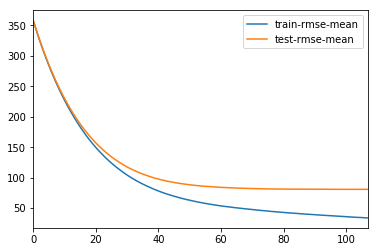

In [29]:
cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=2000, early_stopping_rounds=100,
    verbose_eval=200, show_stdv=False)
cv_output[['train-rmse-mean', 'test-rmse-mean']].plot()
plt.show()

In [30]:
num_boost_rounds = len(cv_output)
print(num_boost_rounds)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round= num_boost_rounds)

108
[14:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:32:16] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { n_trees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


In [31]:
from sklearn.metrics import r2_score
print("R^2 in training: %s"  % r2_score(dtrain.get_label(), model.predict(dtrain)))
print("R^2 in testing: %s"  % r2_score(y_test, model.predict(dtest)))

R^2 in training: 0.986159006697387
R^2 in testing: 0.9423961373048658


In [33]:
# Predicting for whole dataset
dataset['y_pred1_2'] = model.predict(dall)

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions_ XGboost + RF",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")
p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred1_2'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

xgboost with PCA

In [29]:
import xgboost as xgb
xgb_params = {
    'n_trees': 90, 
    'eta': 0.05,
    'max_depth': 35,
    'subsample': 0.7,
    'objective': 'reg:linear',
    'eval_metric': 'rmse',
    'silent': 1
}
dtrain = xgb.DMatrix(X_train1, y_train1)
dtest = xgb.DMatrix(X_test1)
dall = xgb.DMatrix(X3)

[13:49:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[13:49:15] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { n_trees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:49:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[13:49:15] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { n_trees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed d

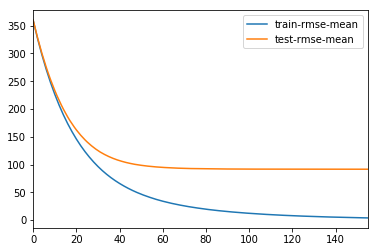

In [30]:
cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=2000, early_stopping_rounds=100,
    verbose_eval=200, show_stdv=False)
cv_output[['train-rmse-mean', 'test-rmse-mean']].plot()
plt.show()

In [31]:
num_boost_rounds = len(cv_output)
print(num_boost_rounds)
model = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round= num_boost_rounds)

156
[13:49:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[13:49:58] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { n_trees, silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:50:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.1.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


In [32]:
from sklearn.metrics import r2_score
print("R^2 in training: %s"  % r2_score(dtrain.get_label(), model.predict(dtrain)))
print("R^2 in testing: %s"  % r2_score(y_test1, model.predict(dtest)))

R^2 in training: 0.9998533852545162
R^2 in testing: 0.9274503143390838


In [34]:
# Predicting for whole dataset
dataset['y_pred1_2'] = model.predict(dall)

# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")
p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred1_2'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# LinearRegression with Random forest

In [35]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn import preprocessing
from sklearn import utils
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

In [36]:
from sklearn import linear_model
lin_reg = linear_model.LinearRegression()
lin_reg.fit(X_train_best, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [37]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred2 = lin_reg.predict(X_test_best)
explained_variance_score2 = explained_variance_score(y_test, y_pred2)
mean_squared_error2 = mean_squared_error(y_test, y_pred2)
r_squared2 = r2_score(y_test, y_pred2)
print('explained variance = {}'.format(explained_variance_score2))
print('mse = {}'.format(mean_squared_error2))
print('r2 = {}'.format(r_squared2))
print(y_pred2)



explained variance = 0.6147372168001664
mse = 39744.449488528575
r2 = 0.6144310897594898
[263.99242355 821.30316578 299.42727969 ... 318.26875519  89.9596929
  35.68748624]


In [38]:
# Predicting for whole dataset
dataset['y_pred2'] = lin_reg.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred2'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# LinearRegression with PCA

In [39]:
from sklearn import linear_model
lin_reg = linear_model.LinearRegression()
lin_reg.fit(X_train1, y_train1)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [40]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred2 = lin_reg.predict(X_test1)
explained_variance_score2 = explained_variance_score(y_test1, y_pred2)
mean_squared_error2 = mean_squared_error(y_test1, y_pred2)
r_squared2 = r2_score(y_test1, y_pred2)
print('explained variance = {}'.format(explained_variance_score2))
print('mse = {}'.format(mean_squared_error2))
print('r2 = {}'.format(r_squared2))
print(y_pred2)

explained variance = 0.13747008284686257
mse = 88451.9263442183
r2 = 0.13721240320871997
[373.9239099  166.24006857 303.14487668 ... 274.3535799  147.03184465
 283.26878508]


In [41]:
# Predicting for whole dataset
dataset['y_pred2'] = lin_reg.predict(X3)
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred2'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# DecisionTreeRegressor with Random forest 

In [42]:
from sklearn.tree import DecisionTreeRegressor as DTR

# fit random forest
dt = DTR(min_samples_leaf=5,min_samples_split=3)
dt.fit(X_train_best, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=5, min_samples_split=3,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [43]:
accuracies1 = cross_val_score(estimator =dt , X = X_train_best,y = y_train, cv = 10, scoring = 'r2')
accuracy = accuracies1.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.916854516266725


In [44]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred3 = dt.predict(X_test_best)
explained_variance_score3 = explained_variance_score(y_test, y_pred3)
mean_squared_error3 = mean_squared_error(y_test, y_pred3)
r_squared3 = r2_score(y_test, y_pred3)
print('explained variance = {}'.format(explained_variance_score3))
print('mse = {}'.format(mean_squared_error3))
print('r2 = {}'.format(r_squared3))
print(y_pred3)


explained variance = 0.9206973557367828
mse = 8180.177878906438
r2 = 0.9206424466577697
[  1.22       908.19166667 360.375      ... 575.92         1.218
   1.21      ]


In [45]:
# Predicting for whole dataset
dataset['y_pred3'] = dt.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred3'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# DecisionTreeRegressor with PCA

In [46]:
from sklearn.tree import DecisionTreeRegressor as DTR

# fit random forest
dt = DTR(min_samples_leaf=5,min_samples_split=3)
dt.fit(X_train1, y_train1)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=5, min_samples_split=3,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [47]:
accuracies1 = cross_val_score(estimator =dt , X = X_train1,y = y_train1, cv = 10, scoring = 'r2')
accuracy = accuracies1.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.8788848431433989


In [48]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred5 = dt.predict(X_test1)
explained_variance_score4 = explained_variance_score(y_test1, y_pred5)
mean_squared_error4 = mean_squared_error(y_test1, y_pred5)
r_squared4 = r2_score(y_test1, y_pred5)
print('explained variance = {}'.format(explained_variance_score4))
print('mse = {}'.format(mean_squared_error4))
print('r2 = {}'.format(r_squared4))
print(y_pred5)

explained variance = 0.8830847197068865
mse = 11987.246419362311
r2 = 0.8830726705707013
[  1.256      899.86125    355.86875    ...   1.24166667   1.28555556
 368.0625    ]


In [49]:
# Predicting for whole dataset
dataset['y_pred5'] = dt.predict(X3)
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred5'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# MLPRegressor with Random forest 

In [50]:
clf = MLPRegressor(hidden_layer_sizes=(5,), activation='relu',solver='adam',learning_rate='adaptive',max_iter=1000,learning_rate_init=0.01,alpha=0.01)
clf.fit(X_train_best, y_train)

MLPRegressor(activation='relu', alpha=0.01, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(5,), learning_rate='adaptive',
             learning_rate_init=0.01, max_fun=15000, max_iter=1000,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)

In [51]:
accuracies1 = cross_val_score(estimator = clf, X = X_train_best,y =y_train  , cv =20, scoring = 'r2')
accuracy = accuracies1.mean()
print('r2 = {}'.format(accuracy))

r2 = 0.5380128200987406


In [52]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred6 = clf.predict(X_test_best)
explained_variance_score6 = explained_variance_score(y_test, y_pred6)
mean_squared_error6 = mean_squared_error(y_test, y_pred6)
r_squared6 = r2_score(y_test, y_pred6)
print('explained variance = {}'.format(explained_variance_score6))
print('mse = {}'.format(mean_squared_error6))
print('r2 = {}'.format(r_squared6))
print(y_pred6)

explained variance = 0.34515129041398596
mse = 68180.85401702985
r2 = 0.33856380146361986
[303.02705077 499.90240454 252.62999437 ... 231.69959317 162.42703436
  -3.26607738]


In [53]:
# Predicting for whole dataset
dataset['y_pred6'] = clf.predict(dataset[['Temperature', 'DayOfYear', 'TimeOfDay(s)']])
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred6'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

# MLPRegressor with PCA

In [54]:
clf1 = MLPRegressor(hidden_layer_sizes=(2,2), activation='relu',solver='adam',learning_rate='adaptive',max_iter=1000,learning_rate_init=0.01,alpha=0.01)
clf1.fit(X_train1, y_train1)

MLPRegressor(activation='relu', alpha=0.01, batch_size='auto', beta_1=0.9,
             beta_2=0.999, early_stopping=False, epsilon=1e-08,
             hidden_layer_sizes=(2, 2), learning_rate='adaptive',
             learning_rate_init=0.01, max_fun=15000, max_iter=1000,
             momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
             power_t=0.5, random_state=None, shuffle=True, solver='adam',
             tol=0.0001, validation_fraction=0.1, verbose=False,
             warm_start=False)

In [55]:
accuracies2 = cross_val_score(estimator = clf1, X = X_train1,y =y_train1  , cv =10, scoring = 'r2')
accuracy = accuracies2.mean()
print('r2 = {}'.format(accuracy))

C:\Users\Shree.Charran\.conda\envs\py35\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:573: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


r2 = 0.33254422956196594


In [56]:
from sklearn.metrics import explained_variance_score, mean_squared_error, r2_score
y_pred7 = clf1.predict(X_test1)
explained_variance_score7 = explained_variance_score(y_test1, y_pred7)
mean_squared_error7= mean_squared_error(y_test1, y_pred7)
r_squared7 = r2_score(y_test1, y_pred7)
print('explained variance = {}'.format(explained_variance_score7))
print('mse = {}'.format(mean_squared_error7))
print('r2 = {}'.format(r_squared7))
print(y_pred7)

explained variance = 0.3468191147012236
mse = 66992.9395843854
r2 = 0.3465300334889376
[123.01613108 101.19770233 414.867749   ... 293.76426239 101.19770233
 494.92526208]


In [57]:
# Predicting for whole dataset
dataset['y_pred7'] = clf1.predict(X3)
# Create Interactive Plot Using Bokeh
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import Range1d
output_notebook() 

p = figure(plot_width=800, 
           plot_height=400,
           title="Solar Irradiance Predictions",
           x_axis_label='Date and Time',
           y_axis_label='Solar Irradiance',
           x_axis_type="datetime")

p.x_range = Range1d(dataset.index[0], dataset.index[600])
p.y_range = Range1d(-100, 1800, bounds=(-100, 1800))
p.line(dataset.index, dataset['Radiation'], legend_label='Observed Solar Irradiance', line_width=1)
p.line(dataset.index, dataset['y_pred7'], legend_label='Predicted Solar Irradiance', line_width=1, line_color="red")

show(p, notebook_handle = True)

Loading BokehJS ...

In [ ]:
dataset.head()